# Laboratorio 2

### EL5206-1 Inteligencia Computacional

**Profesor:** Claudio Perez  
**Auxiliar:** Juan Perez  
**Estudiantes:** Canela Orellana y Maximiliano Varas

El objetivo de esta Actividad de Laboratorio es implementar y analizar algoritmos simples de clasificación
de personas usando información periocular. Debe descargar los archivos ```ojos_gal.zip``` y ```ojos_test.zip``` que
contienen las imágenes necesarias para construir los conjuntos de galería y prueba respectivamente. 

Librerias a utilizar:

In [2]:
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd
from skimage.feature import local_binary_pattern
import os as os
from os import listdir
from os.path import isfile, join


Obtener Path de las imágenes:

In [3]:
#obtener la ruta de la carpeta en la que está el notebook
path_base = os.getcwd()
#se le añade el nombre de cada carpeta para acceder a ellas
folder_gal = path_base+"//ojos_gal//"
folder_test = path_base+"//ojos_test//"
folder_impostor = path_base+"//ojos_impostor//"

Se crea una función para cargar las imágenes a un diccionario:

In [4]:
def cargar_imagenes(path):
    """
        Dado del path de la carpeta carga las imágenes en un diccionario.
    """
    list_names = [f for f in listdir(path) if isfile(join(path, f))]
    dict_res = {}
    for image in list_names:
        dict_res[image[:-4]] = plt.imread(path+image)
    return dict_res

Utilizando la función creada, se cargan las imágenes a un diccionario:

In [5]:
dict_gal = cargar_imagenes(folder_gal)
dict_test = cargar_imagenes(folder_test)
dict_impostor = cargar_imagenes(folder_impostor)

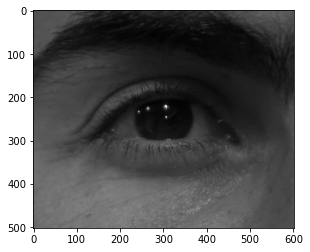

In [6]:
#Prueba para ver que resultó
gal10 = dict_gal['I10_gal']
plt.imshow(gal10,cmap='gray', vmin=0, vmax=255)

### Parte 1
**Implemente el algoritmo de análisis de textura LBP usando una matriz de 3x3.**

Función pre_LBP para obtener el valor binario de la comparación en cuadriculas de 3x3 y retornar su valor decimal correspondiente.

In [7]:
#Retorna el valor decimal de la codificación binaria.
def pre_LBP(image,i,j):
    """
        Función auxiliar para obtener la codificación binaria en decimal. Si el centro es mayor o igual a sus extremos se tiene 1 en binario, para el caso
        contrario 0.
    """
    center = image[i,j]
    i1 = image[i-1,j-1]
    i2 = image[i-1,j]
    i3 = image[i-1,j+1]
    i4 = image[i,j+1]
    i5 = image[i+1,j+1]
    i6 = image[i+1,j]
    i7 = image[i+1,j-1]
    i8 = image[i,j-1]
    valores = [i1, i2, i3, i4, i5, i6, i7, i8]
    res = 0
    for j in range(len(valores)):
        if center >= valores[j]:#h=1
            res += 1*2**(len(valores)-1-j)
    return res
pre_LBP(gal10,1,1)

227

Función LBP: utiliza la función previa para realizar los cálculos y recorre laimagen completa

In [8]:
def LBP(image):
    """
        Aplica LBP a una figura y la retorna.
    """
    dim = image.shape
    res = np.zeros((dim[0]-2, dim[1]-2))
    for i in range(1,dim[0]-1):
        for j in range(1,dim[1]-1):
            res[i-1,j-1] = pre_LBP(image,i,j)
    return res

**Aplique LBP a todas las imágenes de ojos disponibles y guarde los resultados.**

In [9]:
def LBP_dict(dict_images):
    """
        Recibe un diccionario de imágenes y retorna un diccionario con las imágenes posterior a aplicar LBP.
    """
    dict_res = {}
    for key in dict_images.keys():
        dict_res[key+"_LBP"] = LBP(dict_images[key])
    return dict_res

Se obtienen los diccionarios con imagenes transformadas:

In [10]:
dict_gal_LBP = LBP_dict(dict_gal)
dict_test_LBP = LBP_dict(dict_test)
dict_impostor_LBP = LBP_dict(dict_impostor)

Se crea una función para graficar las figuras antes y después de LBP:

In [11]:
def graficar_LBP(dict_images,dict_images_LBP):
    """
        Función que grafica la imagen original y la imagen procesada por LBP. 
    """
    
    l_images = []
    l_LBP= []
    l_names = []
    for key in dict_images.keys():
        l_names+=[key]
        l_images += [dict_images[key]]
    for key in dict_images_LBP.keys(): l_LBP += [dict_images_LBP[key]]
    #return l_images[1]

    for i in range(len(l_names)):
        plt.figure(figsize = (15,30))
        plt.subplot(1, 2, 1)
        plt.imshow(l_images[i],cmap='gray', vmin=0, vmax=255)
        plt.title(f'Imagen Original "{l_names[i]}".')
        plt.xlabel('pixeles')
        plt.ylabel('pixeles')
        plt.subplot(1, 2, 2)
        plt.imshow(l_LBP[i],cmap='gray', vmin=0, vmax=255)
        plt.title(f'Imagen posterior a LBP.')
        plt.xlabel('pixeles')
        plt.ylabel('pixeles')

Gráficos carpeta ```gal```:

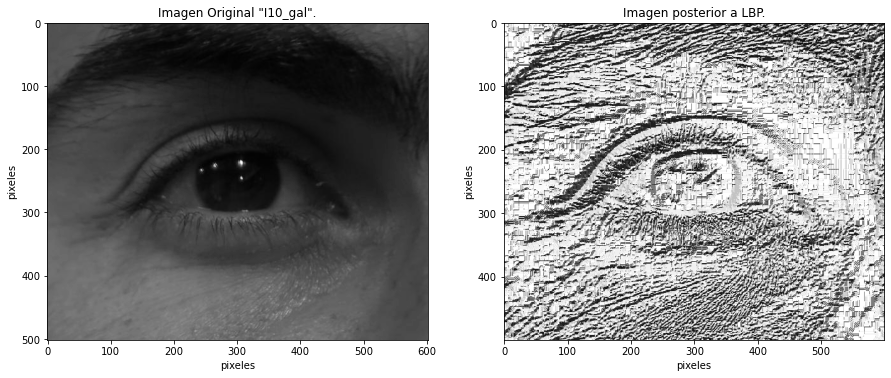

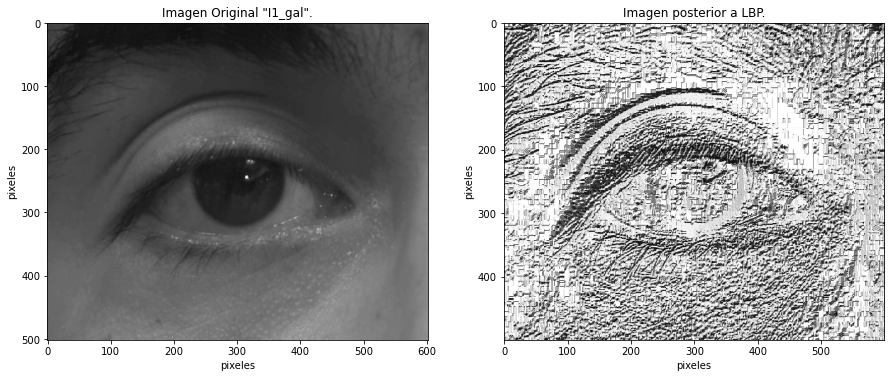

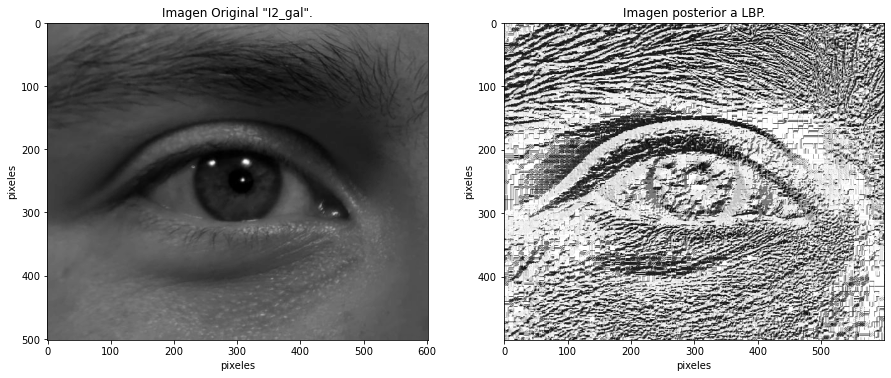

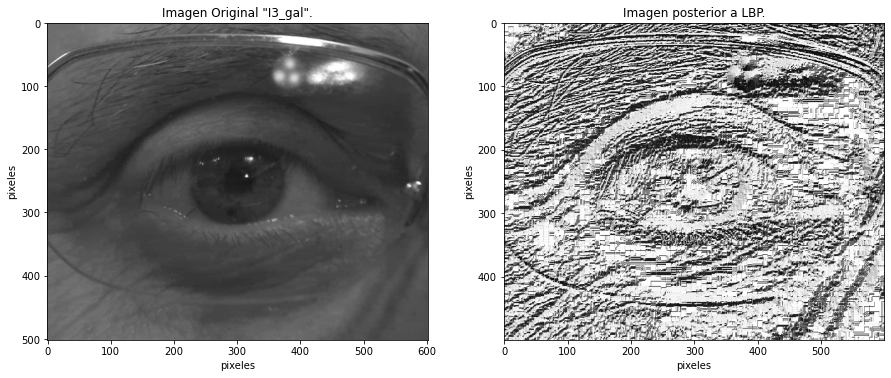

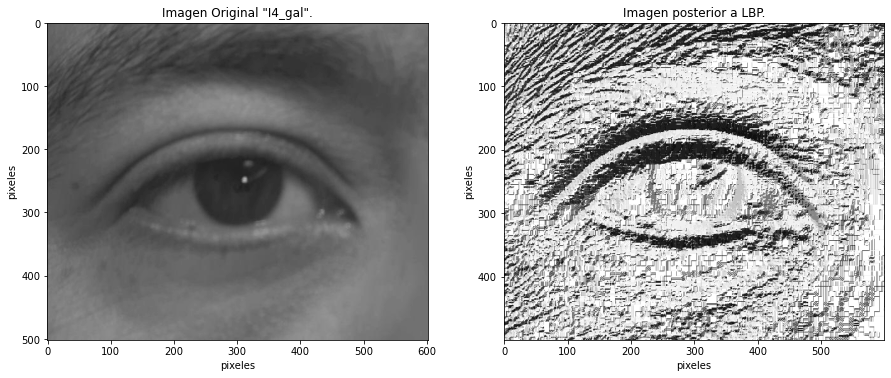

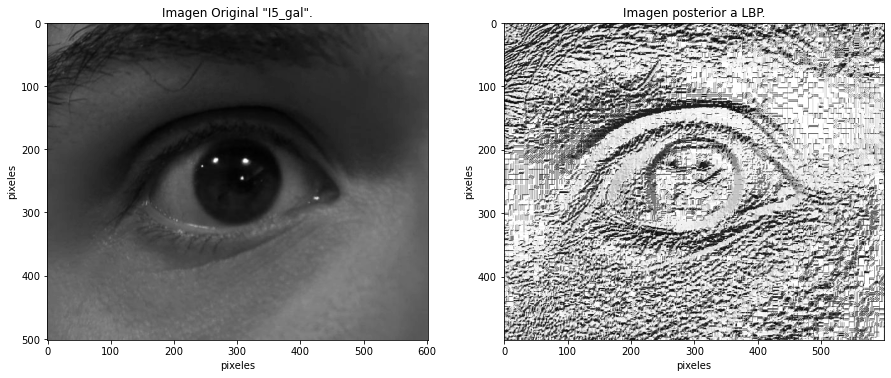

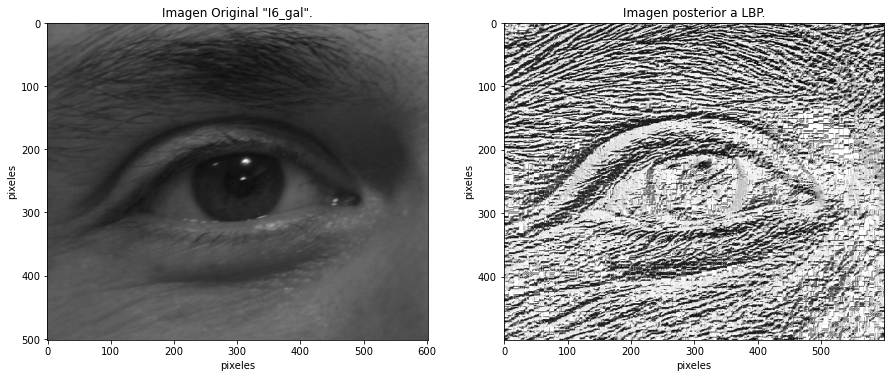

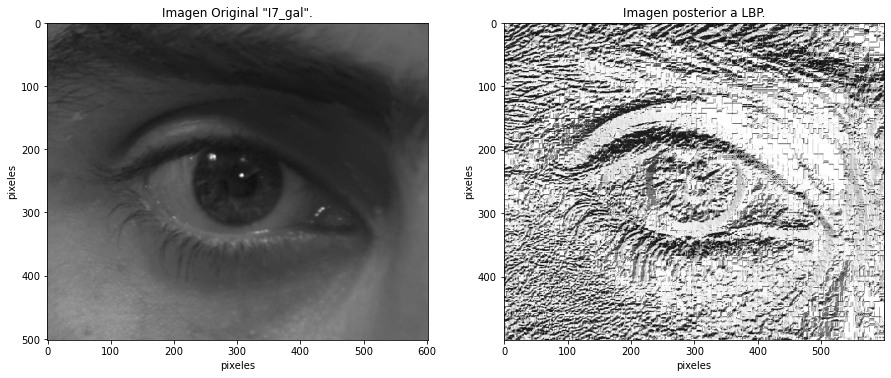

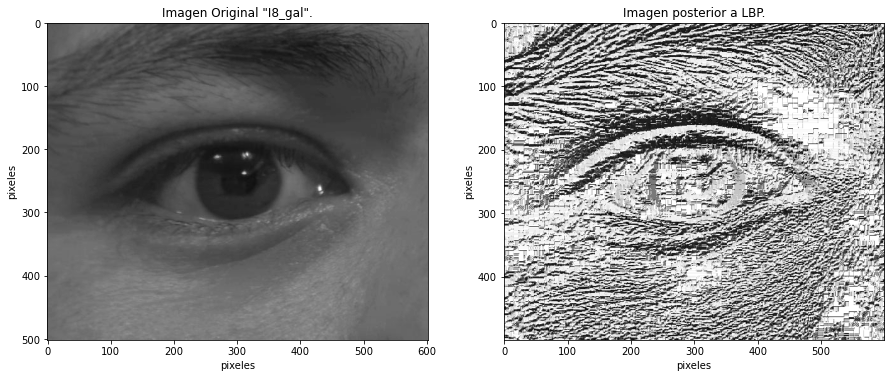

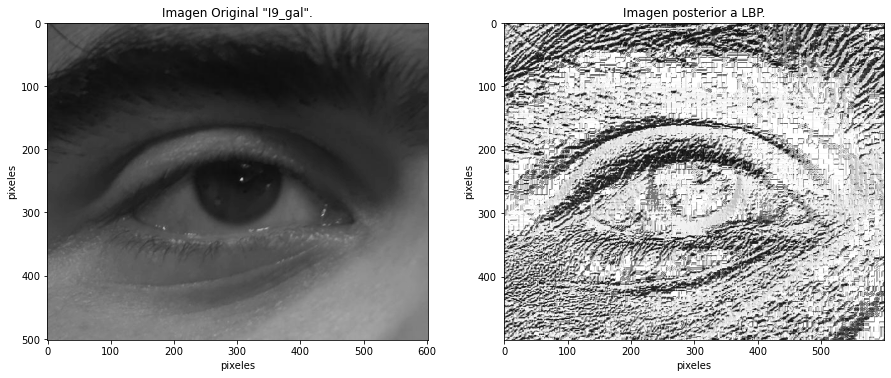

In [12]:
graficar_LBP(dict_gal,dict_gal_LBP)

Gráficos carpeta ```test```:

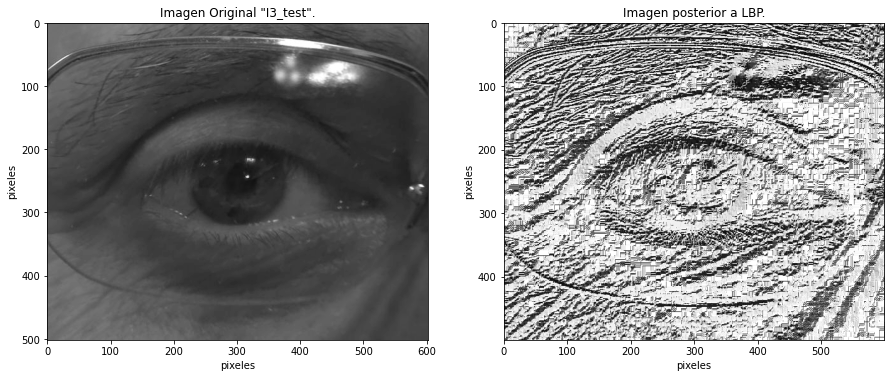

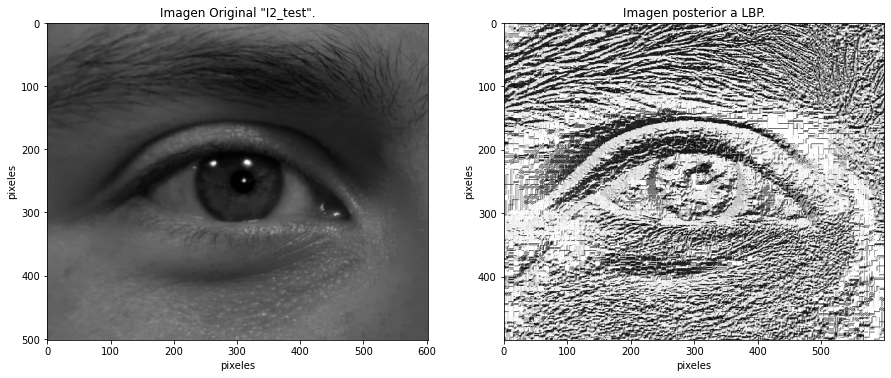

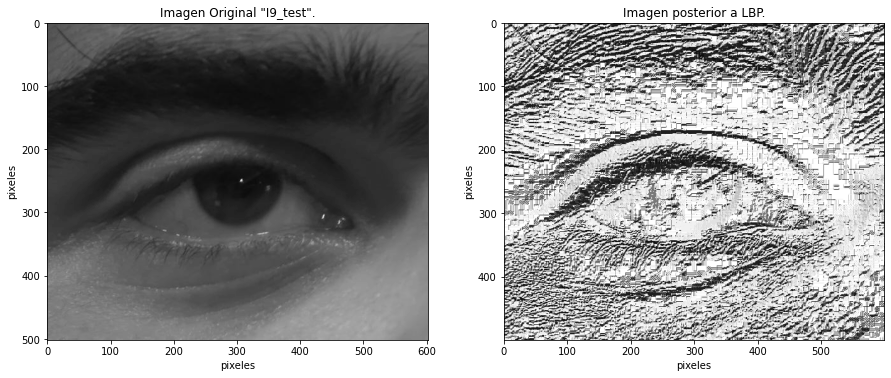

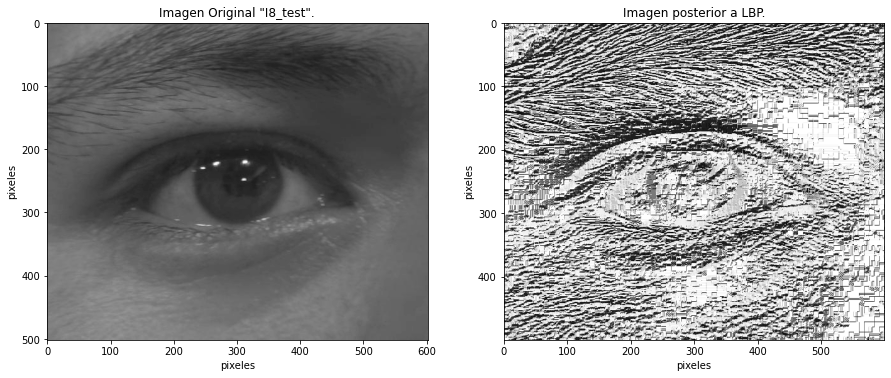

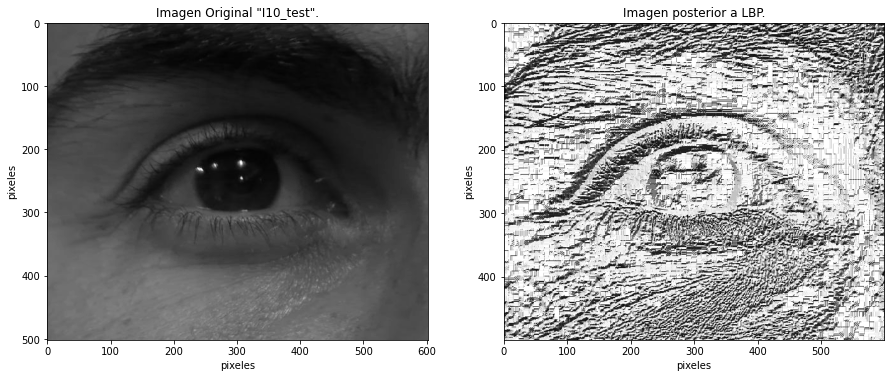

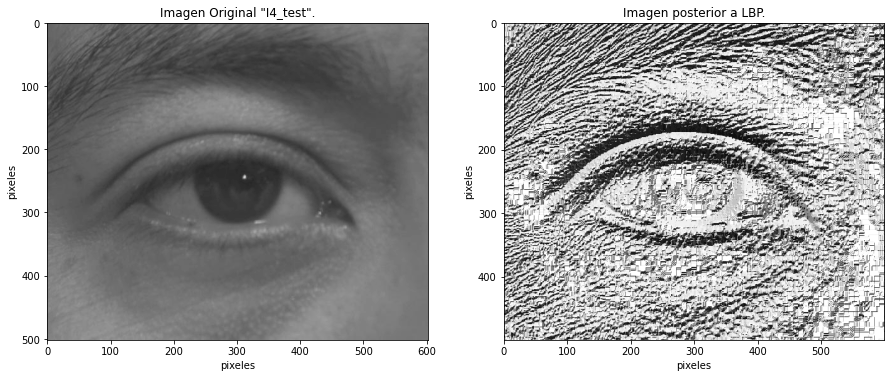

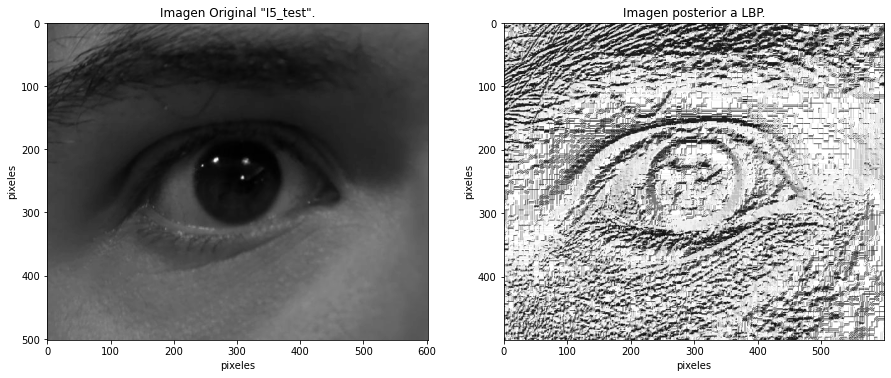

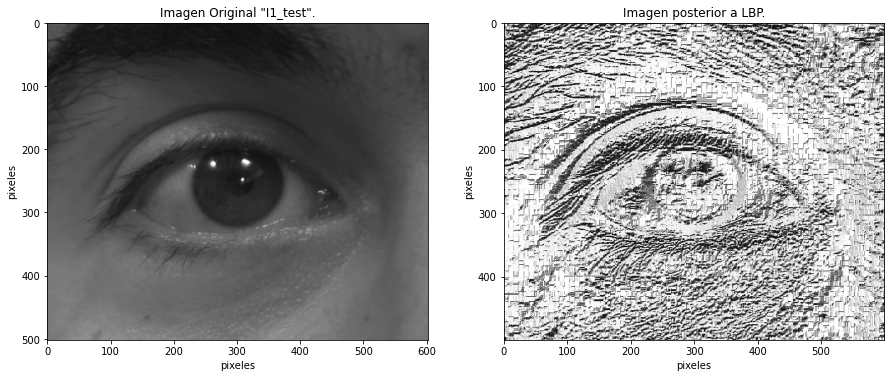

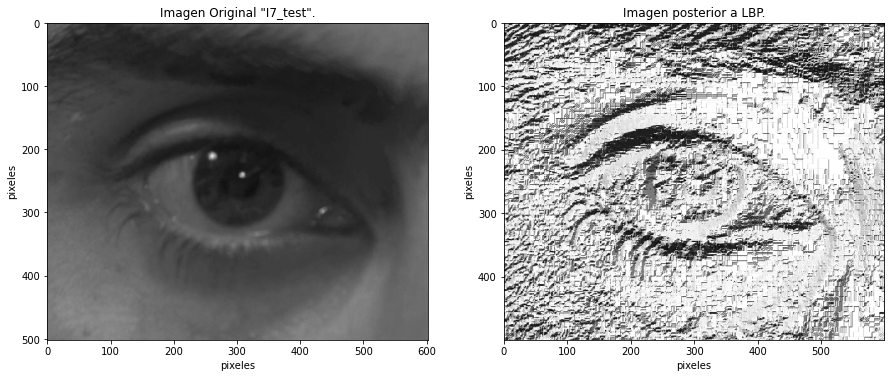

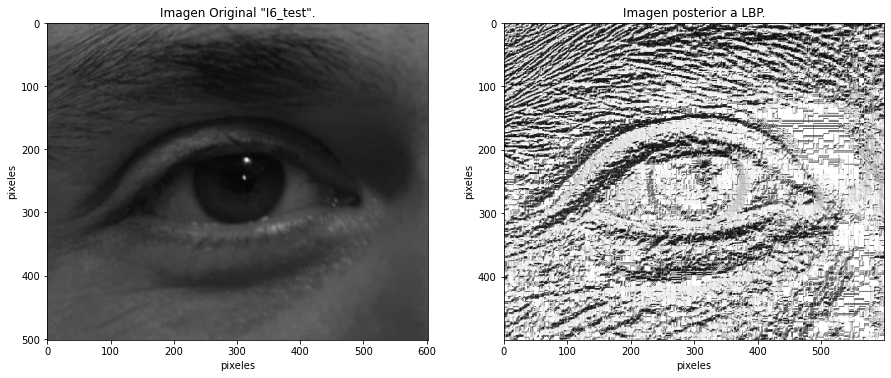

In [12]:
graficar_LBP(dict_test,dict_test_LBP)

Gráficos carpeta ```impostor```:

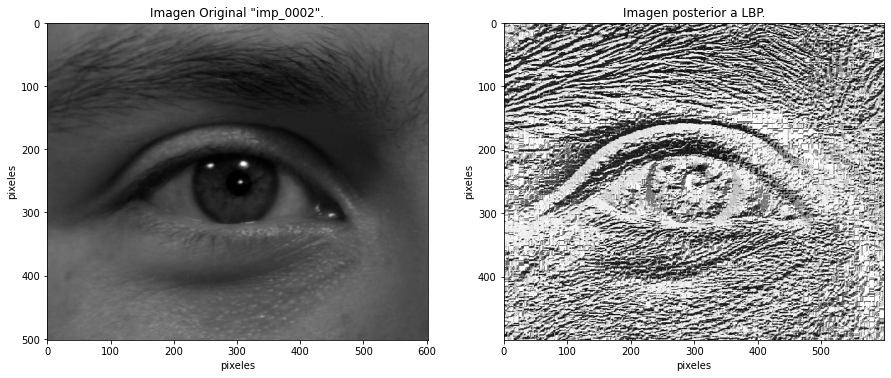

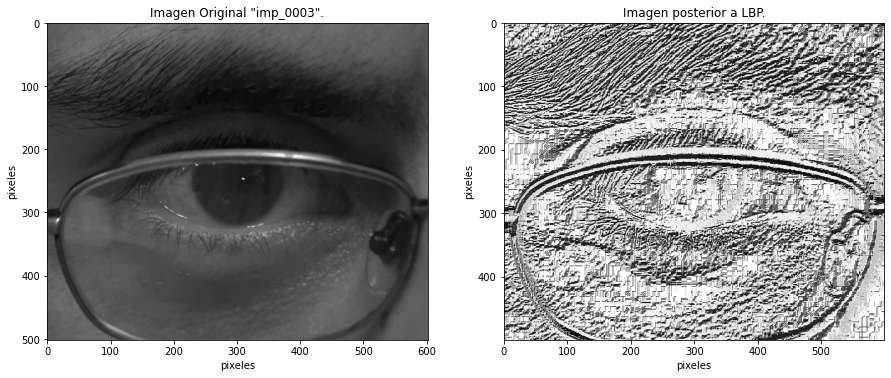

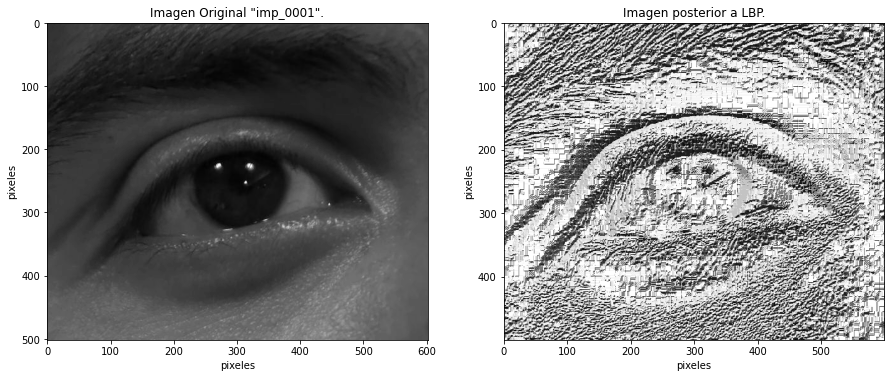

In [13]:
graficar_LBP(dict_impostor,dict_impostor_LBP)

**Describa las imágenes obtenidas ¿Qué características tienen las imágenes procesadas con LBP?**

Las imagenes luego de pasar por el filtro LBP se observan más texturizadas, incluso se pueden observar las texturas de la piel que no se alcanzan a detectar en la imágen original. Lo que sucede es que la paleta de color cambia a una binaria, por lo que la imágen se aclara y en negro sólo aparecen los contenidos relevantes de la imagen, es decir, cuando hubo un cambio brusco de intensidad de color, así es como se obtienen las características relevantes de la imagen.

### Parte 2
**Desarrolle dos métodos para extraer un vector de características para cada imagen.**  

**Método 1**:
Divida la imagen de entrada en 30 regiones de 100x100 pixeles (ancho x alto) y a cada una de ellas
calcúlele un histograma cuantizado en 59 puntos. Concatene los 30 histogramas conseguidos en un
vector de dimensiones 1x1770 que será el elemento de salida al método de extracción de
características.  

**Método 2**: Divida la imagen de entrada en 66 regiones de 100x125 pixeles (ancho x
alto), con traslape de 50 pixeles en cada región y a cada una de ellas calcúlele un histograma
cuantizado en 59 puntos. Concatene los 66 histogramas conseguidos en un vector de dimensiones
1x3894 que será el elemento de salida al método de extracción de características. 

**Método 1:**

In [14]:
dict_gal_LBP['I10_gal_LBP'].shape

(500, 600)

In [13]:
def metodo1(image_LBP):
    """Figuras de 500X600,por lo que se pueden obtener 30 subfiguras de 100X100 sin solaparse. Por lo tanto, se tienen 5x6 regiones.
       Se definen 59 bins y se debe retornar un array de largo 1770 = 59x30. Se permite un rango ([0, 255]]).
    """
    res = np.array([])
    for i in range(5):
        for j in range(6):
            figura = image_LBP[100*i:100*(i+1),100*j:100*(j+1)].ravel()
            res = np.concatenate((res,np.histogram(figura,bins=59, range=([0,256]))[0]),axis=None)

    return res
metodo1(dict_gal_LBP['I10_gal_LBP'])

array([ 150.,   72.,   25., ...,  335.,  240., 4132.])

**Método 2:**

In [16]:
def metodo2(image_LBP):
    """Figuras de 500X600. Se deben obtener 66 subfiguras de 100X125 al solaparse. Por lo tanto, se tienen 11x6 regiones.
       Se definen 59 bins y se debe retornar un array de largo 3894 = 59x66. Se permite un rango ([0, 255]]).
    """
    res = np.array([])
    for i in range(6):
        for j in range(11):
            figura = image_LBP[50*i:100+50*i,75*j:125+75*j].ravel()
            res = np.concatenate((res,np.histogram(figura,bins=59, range=([0,256]))[0]),axis=None)
    return res
metodo2(dict_gal_LBP['I10_gal_LBP']).shape    

(3894,)

### Parte 3
**Implemente la siguiente medida de distancia entre dos vectores de largo n:** 
$$
d(x,y) = \sum_{i=1}^{n}|x_i-y_i|
$$

In [17]:
def dist(x,y):
    if len(x)!=len(y):
        return "Error, distinta dimensión entre arrays"
    else:
        dist = 0
        for i in range(len(x)):
            dist+=abs(x[i]-y[i])
        return dist
dist([1,2], [1,2])

0

### Para cada uno de los métodos implementados en 2. Realice lo siguiente:

### Parte 4
**Construya una base de datos usando las imágenes del archivo ojos_gal.zip. Esto incluye procesar las
imágenes usando LBP, la posterior extracción y almacenamiento del vector de características para
cada una de ellas.**

In [18]:
def crear_BD(dict_image_LBP):
    """
        Recibe un diccionario con imágenes procesadas con LBP y retorna dos diccionarios con con los vectores de características
        obtenidos con el método1 y método2.
        Cada uno de estos diccionarios tienen arrays de características de cada imagen.
    """
    res1 = {} #Diccionario para las caracteristicas método 1.
    res2 = {} #Diccionario para las caracteristicas método 2.
    for key in dict_image_LBP.keys():
        res1[key+"_f1"] = metodo1(dict_image_LBP[key])
        res2[key+"_f2"] = metodo2(dict_image_LBP[key])
    return res1, res2

In [19]:
BD_gal1, BD_gal2  = crear_BD(dict_gal_LBP)

### Parte 5
**Realice una prueba de reconocimiento de cada imagen del archivo ojos_test.zip. 
Para ello debe procesar cada imagen mediante LBP, extraer el vector de características y compararlo con cada uno
de los almacenados en la base de datos usando como medida de similitud la distancia programada.**

Lo primero es crear las dos bases de datos con el conjunto de test.

In [20]:
BD_test1, BD_test2  = crear_BD(dict_test_LBP)

In [21]:
dist(BD_gal1['I10_gal_LBP_f1'], BD_test1['I10_test_LBP_f1'])

41884.0

Se deben comparar utilizando la función de distancia programada anteriormente,

In [22]:
def comp_caract(feat_gal, feat_test):
    """
        Se compara las características de la figure del conjunto de test con todas las del conjunto gal. Se muestra cuál es la que tiene menor distancia
        y se retorn el umbral para el método, que se define como el máximo de las menores distancias. Esto permite que se considere el peor caso y una
        distancia mayor a este umbral corresponde a un impostor.
    """
    l_test = []
    l_gal = []
    res = []
    n_t = os.listdir('ojos_test')
    n_g = os.listdir('ojos_gal')
    #print (n)
    names = ['I10', 'I1', 'I2', 'I3', 'I4', 'I5', 'I6', 'I7', 'I8', 'I9']
    for key in feat_test.keys(): l_test+=[feat_test[key]]
    for key in feat_gal.keys(): l_gal+=[feat_gal[key]]
    for i in range(len(l_test)):
        l_aux = []
        for j in range(len(l_gal)):
            l_aux+=[dist(l_test[i],l_gal[j])]
        l_aux= np.array(l_aux)
        #print(f'+Las distancias de la figura {names[i]}_test a las figuras gal {names} son, respectivamente:')
        #print(l_aux)
        print(f'\033[1mLa figura que menos distancia tiene a \033[93m{n_t[i][:-4]} es {n_g[np.argmin(l_aux)][:-4]}\033[0m: {l_aux[np.argmin(l_aux)]}\033[0m')
        res+= [l_aux[np.argmin(l_aux)]]
    return max(res)
        
umbral1 = comp_caract(BD_gal1, BD_test1)

La figura que menos distancia tiene a I3_test es I3_gal: 46548.0
La figura que menos distancia tiene a I2_test es I2_gal: 30782.0
La figura que menos distancia tiene a I9_test es I9_gal: 66290.0
La figura que menos distancia tiene a I8_test es I8_gal: 80228.0
La figura que menos distancia tiene a I10_test es I10_gal: 41884.0
La figura que menos distancia tiene a I4_test es I4_gal: 73426.0
La figura que menos distancia tiene a I5_test es I5_gal: 70022.0
La figura que menos distancia tiene a I1_test es I1_gal: 71242.0
La figura que menos distancia tiene a I7_test es I7_gal: 70278.0
La figura que menos distancia tiene a I6_test es I6_gal: 85720.0


In [23]:
umbral2 = comp_caract(BD_gal2, BD_test2)

La figura que menos distancia tiene a I3_test es I3_gal: 83098.0
La figura que menos distancia tiene a I2_test es I2_gal: 55842.0
La figura que menos distancia tiene a I9_test es I9_gal: 147136.0
La figura que menos distancia tiene a I8_test es I8_gal: 137850.0
La figura que menos distancia tiene a I10_test es I10_gal: 80764.0
La figura que menos distancia tiene a I4_test es I4_gal: 125572.0
La figura que menos distancia tiene a I5_test es I5_gal: 148048.0
La figura que menos distancia tiene a I1_test es I1_gal: 129640.0
La figura que menos distancia tiene a I7_test es I7_gal: 114510.0
La figura que menos distancia tiene a I6_test es I6_gal: 149044.0


**¿Cuántos reconocimientos correctos se obtienen?**

Se puede apreciar que para los dos métodos utilizados, se obtuvo 100% de acierto, es decir, cada figura del conjunto test tiene la menor distancia a su correspondiente del conjunto gal. En base a eso, se puede definir un umbral para cada método, definiéndolo como el máximo de los valores mínimos de distancia para cada método; esto asegura que se encontrará a los impostores y al falso impostor. 

### Parte 6
**¿Qué pasaría si se tiene como entrada al sistema una imagen de ojo de un individuo que no está en
la base de datos? ¿Qué estrategia implementaría para enfrentar dicho problema?**

Al no estar en la base de datos, luego de procesar la imagen y aplicar cualquiera de los dos métodos, se obtendrá probablemente una distancia muy grande, es decir, notoriamente mayor al umbral que se propuso en la parte anterior. Por ello, para enfrentar este problema, se debe aplicar dicho umbral para discriminar a los impostores de aquellos que pertenecen a la base de datos.

**Pruebe su estrategia usando las imágenes del archivo *ojos_impostor.zip*. Identifique al falso impostor, es decir,
a la persona que está en la carpeta *ojos_impostor* y en la carpeta *ojos_gal***

In [24]:
BD_impostor1, BD_impostor2  = crear_BD(dict_impostor_LBP)

In [25]:
def buscar_impostor(feat_impostor, feat_gal, umbral):
    """
        Dado los impostores, el conjunto gal y un umbral, se busca las distancias de los impostores a la base de datos gal, eligiendo las menores distancias.
        Si esta menor distancia es menor al umbral corresponde a un falso impostor, es decir, está en la carpeta gal.
    """
    print(f'\033[1mEl umbral a utilizar como distancia máxima es: {umbral}.\033[0m')
    l_gal = []
    n_t = os.listdir('ojos_test')
    n_g = os.listdir('ojos_gal')
    names = ['I10', 'I1', 'I2', 'I3', 'I4', 'I5', 'I6', 'I7', 'I8', 'I9']
    for key in feat_gal.keys(): l_gal+=[feat_gal[key]]
    for key in feat_impostor.keys():
        l_aux = []
        for j in range(len(l_gal)):
            l_aux+=[dist(feat_impostor[key],l_gal[j])]
        l_aux = np.array(l_aux)
        if l_aux[np.argmin(l_aux)]<umbral:
            print(f'\033[1mLa figura que menos distancia tiene al impostor \033[93m{key[:-7]} es {n_g[np.argmin(l_aux)][:-4]}\033[0m: {l_aux[np.argmin(l_aux)]}\033[0m -> \033[93mFalso Impostor\033[0m')
        else:
            print(f'\033[1mLa figura que menos distancia tiene al impostor \033[93m{key[:-7]} es {n_g[np.argmin(l_aux)][:-4]}\033[0m: {l_aux[np.argmin(l_aux)]}\033[0m -> \033[93mImpostor\033[0m')


In [26]:
buscar_impostor(BD_impostor1, BD_gal1, umbral1)

El umbral a utilizar como distancia máxima es: 85720.0.
La figura que menos distancia tiene al impostor imp_0002 es I2_gal: 49838.0 -> Falso Impostor
La figura que menos distancia tiene al impostor imp_0003 es I3_gal: 115982.0 -> Impostor
La figura que menos distancia tiene al impostor imp_0001 es I10_gal: 95028.0 -> Impostor


In [27]:
buscar_impostor(BD_impostor2, BD_gal2,umbral2)

El umbral a utilizar como distancia máxima es: 149044.0.
La figura que menos distancia tiene al impostor imp_0002 es I2_gal: 87876.0 -> Falso Impostor
La figura que menos distancia tiene al impostor imp_0003 es I3_gal: 215602.0 -> Impostor
La figura que menos distancia tiene al impostor imp_0001 es I1_gal: 181352.0 -> Impostor


**Explique el criterio utilizado para detectarlo.**

Para detectar al falso impostor se utilizó el criterio del umbral, si se encuentra una distancia mayor al umbral, se trata de un impostor, pero si es menor al umbral, corresponde al falso impostor. De este modo con ambos métodos se encontró que la imagen 2 corresponde al falso impostor.  

En este caso, la estrategia resulta correctamente, pero podría suceder con otro set de datos que entre las imágenes en gal y en test exista una distancia muy pequeña, de modo que s elegiría un umbral muy estricto que no permita distinguir al falso impostor. Por lo que, también sería una buena idea definir un margen permisivo para estos casos.